## 1. Introduction - Business Problem 


1.1 Background:
Some professionals with culinary and hospitality experience have found themselves with a lot more free time recently and are looking for projects to keep themselves. We want to source a new venue to open a kitchen to meet the needs of a changed food market in the last 12 months. We have identified a few key aspects which are crucial to success in the current climate (2020 - 2021) and modern working from home routines of many New Yorkers!

1.2 Problem:
Breaking into the "Working from home" food market. 
> Sourcing a location for a new food kitchen which is close enough to residential areas where the vast majority of office workers are now working from home. 
> The location must be accessible by road for delivery drivers and easily reached by customers for pick up. Hence a kitchen in an industrial area is not suitable. However since we aim primarily to be an online service, a mainstreet unit is not necessary and could save some costs with a side street unit.

Our focus will be on finding a location which is non central and more residential in the New York City area. Since we need to cator for delivery dirvers we do not necessarily need to preference a loction near a subway which might be higher rent on a unit.

1.3 Interest:
New York has a reputation of being one of the foodie capitols of the world with a mix of styles and backgrounds from across the globe. Since sitting in has become a health issue as of late, creating more space for culinary experimenting and utilising support businesses like Uber Eats to serve our customers with a limited distance range. We expect professionals in the food industry will be eager to collaborate on this type of project as we prioritise the kitchen over the dining requirements allowing for more freedom (within budget). Professionals need to arrive ready with an idea to hit the homes of residents in New York twice daily, lunch and dinner, dilvery and pick up only service.

A quick Google search tells us that Statin Island is a more laid back leafy suburb with lower population than the other boroughs, while Manhattan is the economic center of the city. Thus, we will rule out these two boroughs and choose two of the remaining three. 

This Analysis will compare Queens and The Bronx neighbourhood against each other for an area to open a food kitchen for lunch and dinners. The food kitchen will be pick up or delivery only due to restrictions during a pandemic and will likely be closer to residential areas where people are work from home. Tho since New York has a lot of high rise apartments this could still be very central - we shall see!

# 2. Data acquisition and cleaning



# Neighbourhood data
We will look at the data for New York Neighbourhoods which were sourced from a pre-made json file.
Once the data is loaded in a Pandas dataframe we can find the coorindates of each neighbourhood and determine which areas we will look at for the analyses in the next stage of the project.

New York neighbourhood residential data is avilable online at: https://furmancenter.org/stateofthecity/view/citywide-and-borough-data#the-bronx Where there are already interactive maps to review some data and graphs.

The data is available to download at: https://furmancenter.org/coredata/userguide/data-downloads

We will use the population data to help us determine which of the boroughs best fits the population description we are looking for in our target market (i.e. working from home) alongside the data we will extract from FourSquare neighbourhood venues.

# Venue Data
The venue data has been extracted using the Foursquare API. This data contains venue recommendations for all neighborhoods in Mumbai and is used to study the popular venues of different neighborhoods.

# Geographical Coordinates
A pre existing file of New york coorindates exists which has been used for this analysis. This data is relevant for plotting the map of New York using the Folium library in python. The geocoder library in python has been used to obtain latitude and longitude data for various neighborhoods in Mumbai.

In [1]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Libraries
import numpy as np
import pandas as pd # library for data analysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files
import geocoder # import geocoder

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import folium # map rendering library

#lxml will be the foundation for pd.read_html()
import lxml
from lxml import etree

from urllib.request import urlopen
import html5lib

#Lets get some soup to help with scrapping HTML URL
from bs4 import BeautifulSoup
print('bs4 has arrived')

print('Libraries imported.')


bs4 has arrived
Libraries imported.


In [3]:
nyhood = r"C:\Users\Kevin\Desktop\projects\Coursera_Capstone\'newyork_data.json'"
print('Data downloaded!')

Data downloaded!


In [4]:
# Is this the file path being opened as a json file?
with open(nyhood, 'r') as json_data:
    newyork_data = json.load(json_data)


Lets take a look at the untouched file to see what we are dealing with.

In [5]:
newyork_data

{'type': 'FeatureCollection',
 'totalFeatures': 306,
 'features': [{'type': 'Feature',
   'id': 'nyu_2451_34572.1',
   'geometry': {'type': 'Point',
    'coordinates': [-73.84720052054902, 40.89470517661]},
   'geometry_name': 'geom',
   'properties': {'name': 'Wakefield',
    'stacked': 1,
    'annoline1': 'Wakefield',
    'annoline2': None,
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.84720052054902,
     40.89470517661,
     -73.84720052054902,
     40.89470517661]}},
  {'type': 'Feature',
   'id': 'nyu_2451_34572.2',
   'geometry': {'type': 'Point',
    'coordinates': [-73.82993910812398, 40.87429419303012]},
   'geometry_name': 'geom',
   'properties': {'name': 'Co-op City',
    'stacked': 2,
    'annoline1': 'Co-op',
    'annoline2': 'City',
    'annoline3': None,
    'annoangle': 0.0,
    'borough': 'Bronx',
    'bbox': [-73.82993910812398,
     40.87429419303012,
     -73.82993910812398,
     40.87429419303012]}},
  {'type': 'Feature',
 

Fantastic, from reviewing this json file we can pull out the data we want to work with specifically for answering our problem above.

We will take the data from Featurres: Borough, Neighbourhood, Latitude and Longitude. To do this we will isolate the features data first, create a pandas dataframe and then loop through each neighbourhood to fill in the dataframe with the required details.

In [6]:
neighbourhoods_data = newyork_data['features']
neighbourhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

In [7]:
col_names = ['Borough', 'Neighbourhood','Latitude','Longitude']
neighbourhoods = pd.DataFrame(columns=col_names)
neighbourhoods

,Borough,Neighbourhood,Latitude,Longitude


In [8]:
#loop through data and fill data one row at a time
for data in neighbourhoods_data:
    borough = neighbourhood_name = data['properties']['borough']
    neighbourhood_name = data['properties']['name']
    
    neighbourhood_latlon = data['geometry']['coordinates']
    neighbourhood_lat = neighbourhood_latlon[1]
    neighbourhood_lon = neighbourhood_latlon[0]
    
    neighbourhoods = neighbourhoods.append({'Borough': borough,
                                          'Neighbourhood': neighbourhood_name,
                                          'Latitude': neighbourhood_lat,
                                          'Longitude': neighbourhood_lon}, ignore_index=True)

In [9]:
#Check to see if our run was successful
neighbourhoods.head()

,Borough,Neighbourhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [10]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighbourhoods['Borough'].unique()),
        neighbourhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [11]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [12]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighbourhood in zip(neighbourhoods['Latitude'], neighbourhoods['Longitude'], neighbourhoods['Borough'], neighbourhoods['Neighbourhood']):
    label = '{}, {}'.format(neighbourhoods, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

Lets focus out search on Queens and the Bronx. First we will isolate the data for each Borough and then begin to work our data.

In [13]:
Queens_data = neighbourhoods[neighbourhoods['Borough'] == 'Queens'].reset_index(drop=True)
Queens_data.head()

,Borough,Neighbourhood,Latitude,Longitude
0,Queens,Astoria,40.768509,-73.915654
1,Queens,Woodside,40.746349,-73.901842
2,Queens,Jackson Heights,40.751981,-73.882821
3,Queens,Elmhurst,40.744049,-73.881656
4,Queens,Howard Beach,40.654225,-73.838138


In [14]:
Bronx_data = neighbourhoods[neighbourhoods['Borough'] == 'Bronx'].reset_index(drop=True)
Bronx_data.head()

,Borough,Neighbourhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


## 2.1 Queens 
We shall start with the borough Queens for gathering venue data.

In [15]:
# Start with Queens first and see what we have
address = 'Queens, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Queens are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Queens are 40.7498243, -73.7976337.


In [16]:
# create map of Queens using latitude and longitude values
map_Queens = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(Queens_data['Latitude'], Queens_data['Longitude'], Queens_data['Neighbourhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Queens)  
    
map_Queens

# Define our credentials to use FourSquare


In [17]:
CLIENT_ID = 'QJJTSV2VERTXF2DVVTGWKMXXRFQV5NDW2FYWR12MSP0CZARV' # your Foursquare ID
CLIENT_SECRET = '3STHINDGG2G5SDTVQHG331QQKIAVEIUCMDNMVKH1MRTQO5OS' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: QJJTSV2VERTXF2DVVTGWKMXXRFQV5NDW2FYWR12MSP0CZARV
CLIENT_SECRET:3STHINDGG2G5SDTVQHG331QQKIAVEIUCMDNMVKH1MRTQO5OS


In [18]:
Queens_data.loc[0, 'Neighbourhood']

'Astoria'

In [19]:
neighbourhood_latitude = Queens_data.loc[0, 'Latitude'] # neighbourhood latitude value
neighbourhood_longitude = Queens_data.loc[0, 'Longitude'] # neighbourhood longitude value

neighbourhood_name = Queens_data.loc[0, 'Neighbourhood'] # neighbourhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighbourhood_name, 
                                                               neighbourhood_latitude, 
                                                               neighbourhood_longitude))

Latitude and longitude values of Astoria are 40.76850859335492, -73.91565374304234.


Let's get the top 100 venues that are in Astoria within a radius of 500 meters.
First, let's create the GET request URL like this:

In [20]:
radius = 500

LIMIT = 100

url= 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(
    CLIENT_ID,
    CLIENT_SECRET, 
    neighbourhood_latitude, 
    neighbourhood_longitude, 
    VERSION, 
    radius, 
    LIMIT)

url

'https://api.foursquare.com/v2/venues/explore?client_id=QJJTSV2VERTXF2DVVTGWKMXXRFQV5NDW2FYWR12MSP0CZARV&client_secret=3STHINDGG2G5SDTVQHG331QQKIAVEIUCMDNMVKH1MRTQO5OS&ll=40.76850859335492,-73.91565374304234&v=20180605&radius=500&limit=100'

In [21]:
#Send the get request and we can examine the results
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '6057c1058f303b5dae1f09ff'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'},
    {'name': '$-$$$$', 'key': 'price'}]},
  'headerLocation': 'Astoria',
  'headerFullLocation': 'Astoria, Queens',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 101,
  'suggestedBounds': {'ne': {'lat': 40.773008597854925,
    'lng': -73.90972309237958},
   'sw': {'lat': 40.76400858885492, 'lng': -73.9215843937051}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4bdf502a89ca76b062b75d5e',
       'name': 'Favela Grill',
       'location': {'address': '33-18 28th Ave',
        'crossStreet': 'btwn 33rd & 34th St.',
        'lat': 40.76734843380796,
        'lng': -73.9178974

We want to extract a list of category venues from the above request so we build a function:

In [22]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Ok, so now we are ready to get the venue names and we will do some cleaning up of the data while we are here. Some column names need to be changed.

In [23]:
venues = results['response']['groups'][0]['items']

nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

<ipython-input-23-8e141d08c316>:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,Favela Grill,Brazilian Restaurant,40.767348,-73.917897
1,Orange Blossom,Gourmet Shop,40.769856,-73.917012
2,Titan Foods Inc.,Gourmet Shop,40.769198,-73.919253
3,CrossFit Queens,Gym,40.769404,-73.918977
4,Off The Hook,Seafood Restaurant,40.767200,-73.918104


In [24]:
print('{} venues were returned for this Neighbourhood in FrouSquare'.format(nearby_venues.shape[0]))

100 venues were returned for this Neighbourhood in FrouSquare


Now we have built the code for to call on FourSqpaure API, we will iterate through all the neighbourhoods in Queens and then then Bronx before we move on to locating some trends.

In [25]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [26]:
#
Queens_venues =  getNearbyVenues(names=Queens_data['Neighbourhood'],
                                    latitudes = Queens_data['Latitude'],
                                    longitudes = Queens_data['Longitude'])
Queens_venues.head()

Astoria
Woodside
Jackson Heights
Elmhurst
Howard Beach
Corona
Forest Hills
Kew Gardens
Richmond Hill
Flushing
Long Island City
Sunnyside
East Elmhurst
Maspeth
Ridgewood
Glendale
Rego Park
Woodhaven
Ozone Park
South Ozone Park
College Point
Whitestone
Bayside
Auburndale
Little Neck
Douglaston
Glen Oaks
Bellerose
Kew Gardens Hills
Fresh Meadows
Briarwood
Jamaica Center
Oakland Gardens
Queens Village
Hollis
South Jamaica
St. Albans
Rochdale
Springfield Gardens
Cambria Heights
Rosedale
Far Rockaway
Broad Channel
Breezy Point
Steinway
Beechhurst
Bay Terrace
Edgemere
Arverne
Rockaway Beach
Neponsit
Murray Hill
Floral Park
Holliswood
Jamaica Estates
Queensboro Hill
Hillcrest
Ravenswood
Lindenwood
Laurelton
Lefrak City
Belle Harbor
Rockaway Park
Somerville
Brookville
Bellaire
North Corona
Forest Hills Gardens
Jamaica Hills
Utopia
Pomonok
Astoria Heights
Hunters Point
Sunnyside Gardens
Blissville
Roxbury
Middle Village
Malba
Hammels
Bayswater
Queensbridge


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Astoria,40.768509,-73.915654,Favela Grill,40.767348,-73.917897,Brazilian Restaurant
1,Astoria,40.768509,-73.915654,Orange Blossom,40.769856,-73.917012,Gourmet Shop
2,Astoria,40.768509,-73.915654,Titan Foods Inc.,40.769198,-73.919253,Gourmet Shop
3,Astoria,40.768509,-73.915654,CrossFit Queens,40.769404,-73.918977,Gym
4,Astoria,40.768509,-73.915654,Off The Hook,40.767200,-73.918104,Seafood Restaurant


In [27]:
print(Queens_venues.shape)
Queens_venues.head()

(2100, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Astoria,40.768509,-73.915654,Favela Grill,40.767348,-73.917897,Brazilian Restaurant
1,Astoria,40.768509,-73.915654,Orange Blossom,40.769856,-73.917012,Gourmet Shop
2,Astoria,40.768509,-73.915654,Titan Foods Inc.,40.769198,-73.919253,Gourmet Shop
3,Astoria,40.768509,-73.915654,CrossFit Queens,40.769404,-73.918977,Gym
4,Astoria,40.768509,-73.915654,Off The Hook,40.767200,-73.918104,Seafood Restaurant


In [28]:
Queens_venues.groupby('Neighbourhood').count()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Arverne,19,19,19,19,19,19
Astoria,100,100,100,100,100,100
Astoria Heights,11,11,11,11,11,11
Auburndale,19,19,19,19,19,19
Bay Terrace,36,36,36,36,36,36
Bayside,75,75,75,75,75,75
Bayswater,1,1,1,1,1,1
Beechhurst,16,16,16,16,16,16
Bellaire,12,12,12,12,12,12


In [29]:
print('There are {} unique venues in Queens.'.format(len(Queens_venues['Venue Category'].unique())))

There are 274 unique venues in Queens.


## 2.2 The Bronx
We now have data for Queens, lets repeat the same process for the Bronx and we shall do some analyses.

In [30]:
Bronx_data.head()

,Borough,Neighbourhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [31]:
address = 'Bronx, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Bronx are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Bronx are 40.8466508, -73.8785937.


Get the neighbourhood's name for the Bronx as we did for Queens above.

In [32]:
Bronx_data.loc[0, 'Neighbourhood']

Bneighbourhood_latitude = Bronx_data.loc[0, 'Latitude'] # neighbourhood latitude value
Bneighbourhood_longitude = Bronx_data.loc[0, 'Longitude'] # neighbourhood longitude value

Bneighbourhood_name = Bronx_data.loc[0, 'Neighbourhood'] # neighbourhood name

print('Latitude and longitude values of {} are {}, {}.'.format(Bneighbourhood_name, 
                                                               Bneighbourhood_latitude, 
                                                               Bneighbourhood_longitude))


Latitude and longitude values of Wakefield are 40.89470517661, -73.84720052054902.


In [33]:
radius = 500

LIMIT = 100

Burl= 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(
    CLIENT_ID,
    CLIENT_SECRET, 
    Bneighbourhood_latitude, 
    Bneighbourhood_longitude, 
    VERSION, 
    radius, 
    LIMIT)

Burl

'https://api.foursquare.com/v2/venues/explore?client_id=QJJTSV2VERTXF2DVVTGWKMXXRFQV5NDW2FYWR12MSP0CZARV&client_secret=3STHINDGG2G5SDTVQHG331QQKIAVEIUCMDNMVKH1MRTQO5OS&ll=40.89470517661,-73.84720052054902&v=20180605&radius=500&limit=100'

In [34]:
Bresults = requests.get(Burl).json()
Bresults

{'meta': {'code': 200, 'requestId': '6057c136134b3f1b4cfcb12c'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Wakefield',
  'headerFullLocation': 'Wakefield, Bronx',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 9,
  'suggestedBounds': {'ne': {'lat': 40.899205181110005,
    'lng': -73.84125857127495},
   'sw': {'lat': 40.89020517211, 'lng': -73.8531424698231}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4c537892fd2ea593cb077a28',
       'name': 'Lollipops Gelato',
       'location': {'address': '4120 Baychester Ave',
        'crossStreet': 'Edenwald & Bussing Ave',
        'lat': 40.894123150205274,
        'lng': -73.84589162362325,
        'labeledLatLn

In [35]:
Bvenues = Bresults['response']['groups'][0]['items']

Bnearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
Bnearby_venues = Bnearby_venues.loc[:, filtered_columns]

# filter the category for each row
Bnearby_venues['venue.categories'] = Bnearby_venues.apply(get_category_type, axis=1)

# clean columns
Bnearby_venues.columns = [col.split(".")[-1] for col in Bnearby_venues.columns]

Bnearby_venues.head()

<ipython-input-35-9d652bd2eb41>:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  Bnearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,Favela Grill,Brazilian Restaurant,40.767348,-73.917897
1,Orange Blossom,Gourmet Shop,40.769856,-73.917012
2,Titan Foods Inc.,Gourmet Shop,40.769198,-73.919253
3,CrossFit Queens,Gym,40.769404,-73.918977
4,Off The Hook,Seafood Restaurant,40.767200,-73.918104


In [36]:
print('{} venues were returned by FourSquare API.'.format(Bnearby_venues['categories'].shape[0]))

100 venues were returned by FourSquare API.


Since we have the json of venue data, and already created a function above to loop through the json file into a dataframe, we can go ahead with the last part of gathering data.

In [37]:
Bronx_venues =  getNearbyVenues(names=Bronx_data['Neighbourhood'],
                                    latitudes = Bronx_data['Latitude'],
                                    longitudes = Bronx_data['Longitude'])
Bronx_venues.head()

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Claremont Village
Concourse Village
Mount Eden
Mount Hope
Bronxdale
Allerton
Kingsbridge Heights


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
2,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
4,Wakefield,40.894705,-73.847201,Subway,40.890468,-73.849152,Sandwich Place


In [38]:
print(Bronx_venues.shape)
Bronx_venues.head()

(1205, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
2,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
3,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
4,Wakefield,40.894705,-73.847201,Subway,40.890468,-73.849152,Sandwich Place


In [39]:
Bronx_venues.groupby('Neighbourhood').count()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Allerton,30,30,30,30,30,30
Baychester,23,23,23,23,23,23
Bedford Park,36,36,36,36,36,36
Belmont,97,97,97,97,97,97
Bronxdale,11,11,11,11,11,11
Castle Hill,7,7,7,7,7,7
City Island,28,28,28,28,28,28
Claremont Village,23,23,23,23,23,23
Clason Point,12,12,12,12,12,12


In [40]:
print('There are {} uniques categories.'.format(len(Bronx_venues['Venue Category'].unique())))

There are 175 uniques categories.


#  2.3  New York Cencus Data

The last part of the our data collection consists of utilising the New York Census data. New York neighbourhood residential data is avilable online at: https://furmancenter.org/stateofthecity/view/citywide-and-borough-data#the-bronx Where there are already interactive maps to review some data and graphs.

The data is available to download at: https://furmancenter.org/coredata/userguide/data-downloads

To process this data,  I will first import the raw excel file then select the data we want to work with in order to provide a few features which will determine the Borough which is more suitable for our target market.

As a notice: There is further analysis on the New York data set available here: https://github.com/Kevin-Masterson/Coursera_Capstone/blob/main/NY_City_Census_Data.ipynb

We will review features such as:
1) Population in each Borough
2) Income data
3) Education levels
4) Rent burden

In [41]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


## 2.3.1 Data
First things first, lets acquire the excel file and then check our first feature of population. We want access to a large market for our kitchen.

In [42]:
NYfile = r'C:\Users\Kevin\Desktop\projects\Coursera_Capstone\Neighorhood_Indicators_CoreDataDownload_2020-06-30.xlsx'
nydata = pd.read_excel(NYfile, sheet_name='Data', index_col=[0])
nydata.head()

,Region Display,Region Name,Region Type,Year,adlt_incar_rt,afford_le030_rct,afford_le080_rct,afford_le120_rct,crime_all_rt,crime_prop_rt,crime_viol_rt,gross_rent_0_1beds,gross_rent_2_3beds,hh_alone_pct,hh_inc_med_adj,hh_inc_own_med_adj,hh_inc_rent_med_adj,hh_u18_pct,hp_first_fhava_pct,hp_first_hi_pct,hp_first_orig,hp_first_orig_lmi_app_pct,hp_first_orig_lmi_nbhd_pct,hp_first_orig_rt,hpi_1f,hpi_4f,hpi_al,hpi_cn,hpi_ot,income_diversity_ratio,lp_all,lp_fam14condo_initial,lp_fam14condo_rate,lp_fam14condo_repeat,med_r_1f,med_r_4f,med_r_cn,med_r_ot,nb_permit_res_units,pct_prof_ela,pct_prof_math,pfn_fam14condo,pfn_fam14condo_rate,pop_65p_pct,pop_bornstate_pct,pop_commute_carfree_pct,pop_commute_time_avg,pop_disabled_pct,pop_discon_youth_pct,pop_edu_collp_pct,pop_edu_nohs_pct,pop_foreign_pct,pop_num,pop_pov_65p_pct,pop_pov_pct,pop_pov_u18_pct,pop_race_asian_pct,pop_race_black_pct,pop_race_div_idx,pop_race_hisp_pct,pop_race_white_pct,pop16_laborforce_pct,pop16_unemp_pct,population_density,priv_evic_amt_sought_med_adj,priv_evic_filing_rt,priv_evic_filings,prox_park_pct,prox_subway_pct,rburden_mod_ami_81_120,rburden_mod_ami_le80,rburden_sev_ami_81_120,rburden_sev_ami_le80,refi_hi_pct,refi_orig,refi_orig_rt,rent_asking_med,rent_burden_med,rent_burden_mod_pct,rent_burden_sev_pct,rent_gross_med_adj,rent_gross_recent_med_adj,rent_pct_nycha,reo,serious_viol_rate,shd_420c_props,shd_420c_units,shd_421a_props,shd_421a_units,shd_all_sub_props,shd_all_sub_units,shd_ex_2020_2025_props,shd_ex_2020_2025_units,shd_ex_2026_2035_props,shd_ex_2026_2035_units,shd_ex_2036_later_props,shd_ex_2036_later_units,shd_hud_finins_props,shd_hud_finins_units,shd_hud_pbrap_props,shd_hud_pbrap_units,shd_lihtc_props,shd_lihtc_units,shd_ml_props,shd_ml_units,shd_nyc_prog_props,shd_ph_props,shd_ph_units,total_viol_rate,unit_num,unit_occ_own_pct,unit_occ_rent_sevcrowd_pct,unit_vac_rent_pct,units_cert,volume_1f,volume_4f,volume_al,volume_cn,volume_ot,voucher_pct
Region ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
606,NYC,New York City,City,2000,1340.7,NaN,NaN,NaN,23.1,15.4,7.6,NaN,NaN,NaN,60180.0,NaN,NaN,0.34,NaN,NaN,NaN,NaN,NaN,NaN,100.0,100.0,100.0,100.0,100.0,NaN,7351.0,5168.0,9.0,1315.0,329870.0,184930.0,402900.0,64970.0,15544.0,NaN,NaN,NaN,NaN,0.117,NaN,0.638,40.0,NaN,NaN,0.274,NaN,0.359,8008278.0,NaN,0.212,NaN,0.097,0.245,0.74,0.27,0.35,NaN,0.0957,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.262,NaN,0.237,1070.0,NaN,NaN,987.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.302,NaN,NaN,13603.0,13586.0,13702.0,33454.0,4842.0,1324.0,NaN
606,NYC,New York City,City,2001,NaN,NaN,NaN,NaN,20.3,13.6,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,111.6,111.7,112.1,115.1,110.8,NaN,7308.0,5185.0,9.0,1379.0,358320.0,199690.0,430070.0,70690.0,15744.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,966.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14289.0,13750.0,14158.0,34564.0,5281.0,1375.0,NaN
606,NYC,New York City,City,2002,NaN,NaN,NaN,NaN,19.3,12.9,6.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,121.4,122.1,123.6,129.2,129.4,NaN,7993.0,5701.0,10.0,1613.0,385010.0,211520.0,470570.0,77980.0,18879.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,695.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15024.0,16917.0,17561.0,44909.0,8430.0,2001.0,NaN
606,NYC,New York City,City,2003,NaN,NaN,NaN,NaN,18.4,12.4,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,143.8,146.2,143.6,139.2,161.1,NaN,7645.0,5287.0,9.4,1697.0,443390.0,2

## 2.3.2 Population
A little bit of cleaning data to access the columns and the neighbourhood only. Anything else is excess memeory used in our code.

In [43]:
pop = nydata[['Region Display', 'Year','pop_num']]
Queenspop = pop.loc[pop['Region Display'] == 'QN'] # QN is Queen's code
Queenspop.dropna(inplace=True)
Bronxpop = pop.loc[pop['Region Display'] == 'BX'] # BX is the Bronx code 
Bronxpop.dropna(inplace=True)

<ipython-input-43-a672611c2b38>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Queenspop.dropna(inplace=True)
<ipython-input-43-a672611c2b38>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Bronxpop.dropna(inplace=True)


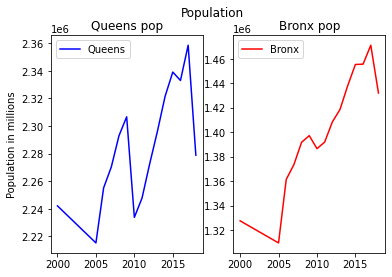

In [44]:
x = Queenspop[['Year']]

y1 = Queenspop[['pop_num']]
y2 = Bronxpop[['pop_num']]

fig, axes = plt.subplots(nrows=1, ncols=2)
fig.suptitle('Population')
ax0, ax1  = axes.flatten()

ax0.plot(x, y1, color='b', label='Queens')
ax0.legend(prop={'size': 10})
ax0.set_ylabel('Population in millions')
ax0.set_title('Queens pop')

ax1.plot(x, y2, color='r', label='Bronx')
ax1.legend(prop={'size': 10})
ax1.set_title('Bronx pop')

plt.show()

Straight off, we can see that Queens has a population of approx. 1 million more than the Bronx which is a question we wanted to answer initially.

## 2.3.3 Income Data
hh_inc_med_adj: The median household's total income of all members of the household aged 15 years or older. 
hh_inc_own_med_adj: The median owner-occupied household's total income of all members of the household aged 15 years or older. hh_inc_rent_med_adj: The median renter household's total income of all members of the household aged 15 years or older.

<ipython-input-45-bab01c156ed5>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Qincome.dropna(inplace=True)
<ipython-input-45-bab01c156ed5>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Bincome.dropna(inplace=True)


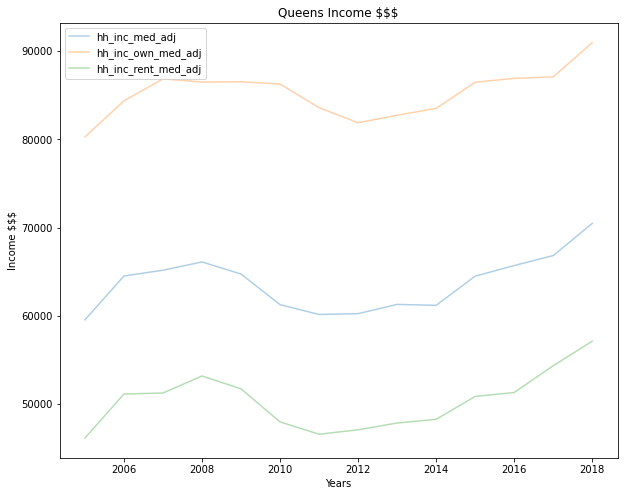

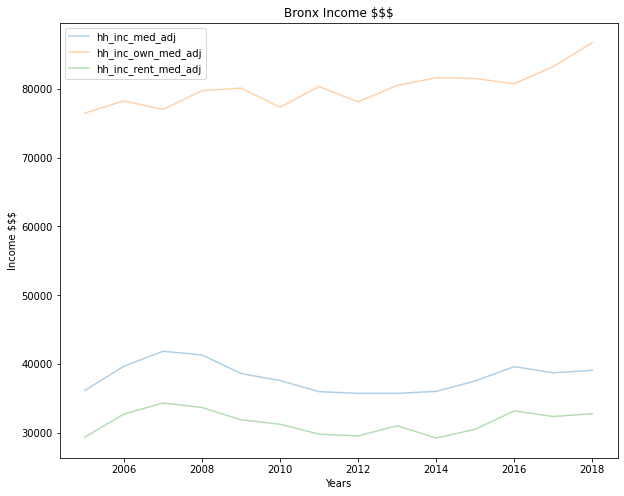

In [45]:
#Income in the Boroughs
incomedata = nydata[['Region Display', 'Region Name', 'Region Type', 'Year','hh_inc_med_adj', 'hh_inc_own_med_adj','hh_inc_rent_med_adj']]
Qincome = incomedata.loc[incomedata['Region Display'] == 'QN']
Bincome = incomedata.loc[incomedata['Region Display'] == 'BX']
Qincome.dropna(inplace=True)
Bincome.dropna(inplace=True)


Qincome.plot('Year', kind='line', alpha=0.35, figsize=(10, 8))
plt.title('Queens Income $$$')
plt.ylabel('Income $$$')
plt.xlabel('Years')
plt.show()


Bincome.plot('Year', kind='line', alpha=0.35, figsize=(10, 8))
plt.title('Bronx Income $$$')
plt.ylabel('Income $$$')
plt.xlabel('Years')
plt.show()

plt.show()

Queens has a higher median household income, and a larger population!

## 2.3.4 Educated Population Data
% population over 25 who have obtained a degree

pop_edu_collp_pct: The percentage of the population aged 25 and older who have attained a bachelor's degree or higher. pop_edu_nohs_pct: The percentage of the population aged 25 and older who have not graduated from high school or received a GED.

<ipython-input-46-ec54fb425378>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Queensedupop.dropna(inplace=True)
<ipython-input-46-ec54fb425378>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Bronxedupop.dropna(inplace=True)


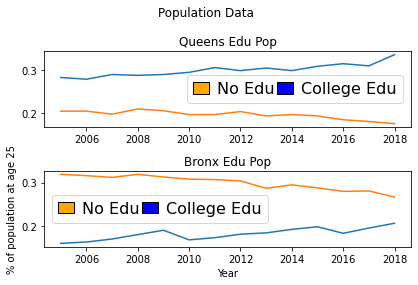

In [46]:
edupop = nydata[['Region Display', 'Region Name', 'Region Type', 'Year','pop_edu_collp_pct', 'pop_edu_nohs_pct']]
Queensedupop = edupop.loc[edupop['Region Display'] == 'QN']
Bronxedupop = edupop.loc[edupop['Region Display'] == 'BX']

Queensedupop.dropna(inplace=True)
Bronxedupop.dropna(inplace=True)

x = Queensedupop[['Year']]

y1 = Queensedupop[['pop_edu_collp_pct', 'pop_edu_nohs_pct']]
y2 = Bronxedupop[['pop_edu_collp_pct', 'pop_edu_nohs_pct']]

fig, (ax1, ax2) = plt.subplots(2)
fig.suptitle('Population Data')
ax1.plot(x, y1)
ax1.set_title('Queens Edu Pop')
ax2.plot(x, y2)
ax2.set_title('Bronx Edu Pop')
plt.ylabel('% of population at age 25')
plt.xlabel('Year')

from matplotlib.patches import Patch
pa1 = Patch(facecolor='orange', edgecolor='black')
pa2 = Patch(facecolor='blue', edgecolor='black')

ax1.legend(handles=[pa1, pa2],
          labels=['No Edu  ', 'College Edu'],
          ncol=4, handletextpad=0.5, handlelength=1.0, columnspacing=-0.5, fontsize=16)
ax2.legend(handles=[pa1, pa2 ],
          labels=['No Edu  ',  'College Edu'],
          ncol=2, handletextpad=0.5, handlelength=1.0, columnspacing=-0.5, loc='center left', fontsize=16)

fig.tight_layout()
plt.show()

A moment of reflection...

From the population, income and education data, it appears there is a trend emerging. I dont know much about these boroughs personally, but i think our target market of professionals working from home will be in a higher income and higher educated area.

New York is an expesive city so we will look at how each area matches up to the rent burden, is there a proportionate amount of household wages being paid on rent in a more affluent area?

## 2.3.5 Rent burden

The data explained:

rburden_mod_ami_81_120: The share of moderate-income renter households whose gross rent made up at least 30 percent of their monthly pre-tax income. 

rburden_mod_ami_le80: The share of low-income renter households whose gross rent made up at least 30 percent of their monthly pre-tax income. 

rburden_sev_ami_81_120: The share of moderate-income renter households whose gross rent made up at least 50 percent of their monthly pre-tax income. 

rburden_sev_ami_le80: The share of low-income renter households whose gross rent made up at least 50 percent of their monthly pre-tax income.

In [47]:
rentburden = nydata[['Region Display', 'Region Name', 'Region Type', 'Year','rburden_mod_ami_81_120', 'rburden_mod_ami_le80','rburden_sev_ami_81_120', 'rburden_sev_ami_le80']]
Queens_rburden = rentburden.loc[rentburden['Region Display'] == 'QN']
Queens_rburden.dropna(inplace=True)
Bronx_rburden = rentburden.loc[rentburden['Region Display'] == 'BX']
Bronx_rburden.dropna(inplace=True)


<ipython-input-47-9bfd2d1de86c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Queens_rburden.dropna(inplace=True)
<ipython-input-47-9bfd2d1de86c>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Bronx_rburden.dropna(inplace=True)


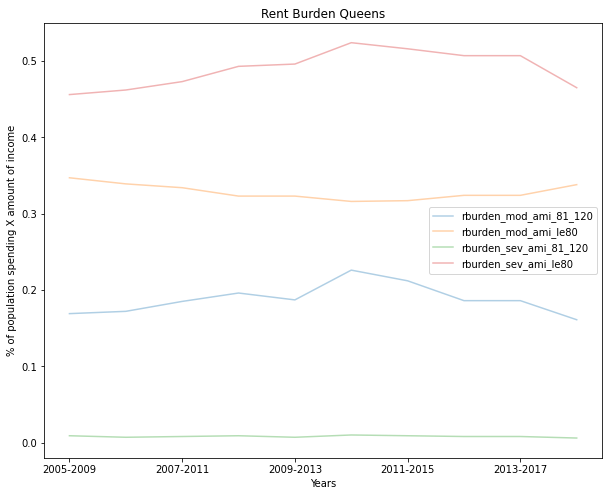

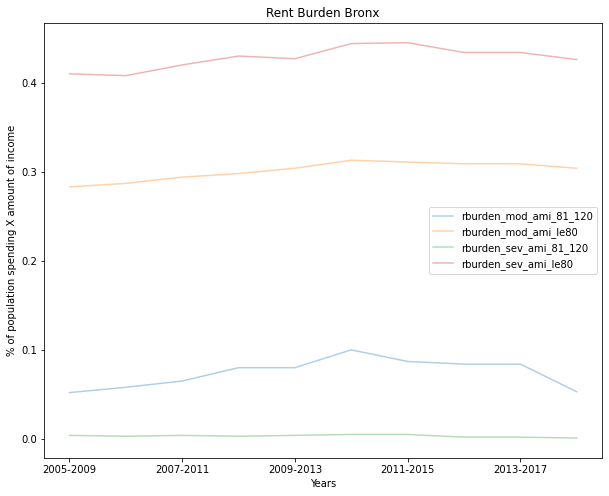

In [48]:
Queensrbplt = Queens_rburden[['Year','rburden_mod_ami_81_120', 'rburden_mod_ami_le80','rburden_sev_ami_81_120', 'rburden_sev_ami_le80']]
Bronx_rburden = Bronx_rburden[['Year','rburden_mod_ami_81_120', 'rburden_mod_ami_le80','rburden_sev_ami_81_120', 'rburden_sev_ami_le80']]

Queensrbplt.plot('Year', kind='line', alpha=0.35, figsize=(10, 8))

plt.title('Rent Burden Queens')
plt.ylabel('% of population spending X amount of income')
plt.xlabel('Years')

Bronx_rburden.plot('Year', kind='line', alpha=0.35, figsize=(10, 8))
plt.title('Rent Burden Bronx')
plt.ylabel('% of population spending X amount of income')
plt.xlabel('Years')

plt.show()

In [49]:
new = Bronx_rburden['Year'].str.split("-", n = 1, expand = True) 
Bronx_rburden["yearend"] = new[1]

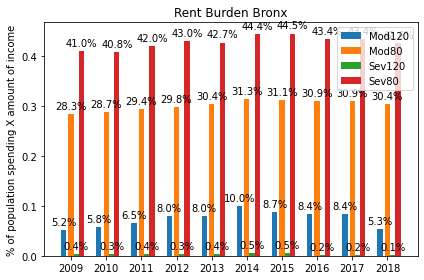

In [50]:
x = np.arange(len(Bronx_rburden['Year']))  # the label locations
width = 0.15  # the width of the bars

w = width
bar1 = x
bar2 = [i+w for i in bar1]
bar3 = [i+w for i in bar2]
bar4 = [i+w for i in bar3]

fig, ax = plt.subplots()
#rects1 = ax.bar(x - width/4, Bronx_rburden['rburden_mod_ami_81_120'], width, label='Mod120')
rects1 = ax.bar(x - width/2.5, Bronx_rburden['rburden_mod_ami_81_120'], width, label='Mod120')
rects2 = ax.bar(bar2, Bronx_rburden['rburden_mod_ami_le80'], width, label='Mod80')
rects3 = ax.bar(bar3, Bronx_rburden['rburden_sev_ami_81_120'], width, label='Sev120')
rects4 = ax.bar(bar4, Bronx_rburden['rburden_sev_ami_le80'], width, label='Sev80')



# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('% of population spending X amount of income')
ax.set_title('Rent Burden Bronx')
ax.set_xticks(bar1 + w )
ax.set_xticklabels(Bronx_rburden["yearend"])
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{0:.1%}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)

fig.tight_layout()

plt.show()

<ipython-input-51-e8c1affdb4ca>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Queens_rburden["yearend"] = new[1]


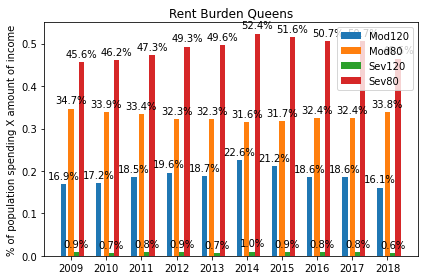

In [51]:
new = Queens_rburden['Year'].str.split("-", n = 1, expand = True) 
Queens_rburden["yearend"] = new[1]

#Queensrbplt

x = np.arange(len(Queens_rburden['Year']))  # the label locations
width = 0.15  # the width of the bars

w = width
bar1 = x
bar2 = [i+w for i in bar1]
bar3 = [i+w for i in bar2]
bar4 = [i+w for i in bar3]

fig, ax = plt.subplots()
#rects1 = ax.bar(x - width/4, Bronx_rburden['rburden_mod_ami_81_120'], width, label='Mod120')
rects1 = ax.bar(x - width/2.5, Queens_rburden['rburden_mod_ami_81_120'], width, label='Mod120')
rects2 = ax.bar(bar2, Queens_rburden['rburden_mod_ami_le80'], width, label='Mod80')
rects3 = ax.bar(bar3, Queens_rburden['rburden_sev_ami_81_120'], width, label='Sev120')
rects4 = ax.bar(bar4, Queens_rburden['rburden_sev_ami_le80'], width, label='Sev80')



# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('% of population spending X amount of income')
ax.set_title('Rent Burden Queens')
ax.set_xticks(bar1 + w )
ax.set_xticklabels(Queens_rburden["yearend"])
ax.legend()

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)

fig.tight_layout()

plt.show()

## 2.3.6 Census Insights

There is clear evidence here that Queens is an are with:
1. Higher overall population
2. Higher median base level of income for that population
3. Higher Educated population by 25

These 3 factors contribute to who we would expect to be our professionals working from home. Interesting, however, it to note that even with this factor at hand, there is still a larger portion of the residence in Queens within the rent burden status. Is this poeple living beyond there means (and wont be buying our meals) or is it the price of rent in an already affluent area? its difficult to tell. Either way, there are a lot more people on higher income not in the rent burden status which is positive for our proposed venture!

# 2.4 Analyse Queens and the Bronx FourSquare API Data
Going back to the venue data we collected earlier - for each of Queens and the Bronx - we will analyse the content and dig out some interesting results which will help us find a suitable location to look for a kitchen unit for our restauranteurs.

## 2.4.1 Queens FourSquare Venue Data

In [52]:
# one hot encoding
Queens_onehot = pd.get_dummies(Queens_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to Queens_venues
Queens_onehot['Neighbourhood'] = Queens_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [Queens_onehot.columns[-1]] + list(Queens_onehot.columns[:-1])
Queens_onehot = Queens_onehot[fixed_columns]

Queens_onehot.head()

,Neighbourhood,Accessories Store,Afghan Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Beach,Beach Bar,Beer Garden,Bike Trail,Bistro,Board Shop,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Basketball Court,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Hardware Store,Health & Beauty Service,Health Food Store,Himalayan Restaurant,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoors & Recreation,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool Hall,Post Office,Pub,Ramen Restaurant,Rental Car Location,Rental Service,Resort,Rest Area,Restaurant,Rock Club,Romanian Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,South American Restaurant,Southern / Soul Food Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,State / Provincial Park,Steakhouse,Storage Facility,Summer Camp,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Tibetan Restaurant,Toy / Game Store,Track,Trail,Train,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Weight Loss Center,Wine Bar,Wine Shop,Wings Joint,Women'

In [53]:
Queens_onehot.shape

(2100, 275)

Thats a lot of venues to dig through. We can group rows by neighbourhood and by taking the mean of the frequency of occurrence of each category.

In [54]:
Queens_grouped = Queens_onehot.groupby('Neighbourhood').mean().reset_index()
print(Queens_grouped.shape)
Queens_grouped

(81, 275)


,Neighbourhood,Accessories Store,Afghan Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Workshop,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Beach,Beach Bar,Beer Garden,Bike Trail,Bistro,Board Shop,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Basketball Court,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Hardware Store,Health & Beauty Service,Health Food Store,Himalayan Restaurant,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoors & Recreation,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool Hall,Post Office,Pub,Ramen Restaurant,Rental Car Location,Rental Service,Resort,Rest Area,Restaurant,Rock Club,Romanian Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,South American Restaurant,Southern / Soul Food Restaurant,Souvlaki Shop,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,State / Provincial Park,Steakhouse,Storage Facility,Summer Camp,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Tibetan Restaurant,Toy / Game Store,Track,Trail,Train,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Weight Loss Center,Wine Bar,Wine Shop,Wings Joint,Women'

Let's print each neighborhood along with the top 5 most common venues

In [55]:
num_top_venues = 5

for hood in Queens_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = Queens_grouped[Queens_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:] 
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Arverne----
           venue  freq
0      Surf Spot  0.21
1  Metro Station  0.11
2    Coffee Shop  0.05
3    Pizza Place  0.05
4          Beach  0.05


----Astoria----
                       venue  freq
0                        Bar  0.07
1  Middle Eastern Restaurant  0.06
2                 Hookah Bar  0.04
3           Greek Restaurant  0.04
4         Seafood Restaurant  0.04


----Astoria Heights----
                venue  freq
0              Bakery  0.09
1  Italian Restaurant  0.09
2        Burger Joint  0.09
3         Bus Station  0.09
4         Supermarket  0.09


----Auburndale----
                venue  freq
0  Italian Restaurant  0.05
1               Train  0.05
2       Deli / Bodega  0.05
3            Pharmacy  0.05
4          Comic Shop  0.05


----Bay Terrace----
                 venue  freq
0       Clothing Store  0.11
1  American Restaurant  0.08
2        Women's Store  0.06
3           Donut Shop  0.06
4           Kids Store  0.06


----Bayside----
               venue 

                venue  freq
0               Hotel  0.17
1    Basketball Court  0.06
2  Athletics & Sports  0.06
3                Park  0.06
4         Beer Garden  0.06


----Ravenswood----
                 venue  freq
0   Chinese Restaurant  0.12
1        Grocery Store  0.08
2  Japanese Restaurant  0.04
3           Bagel Shop  0.04
4           Food Truck  0.04


----Rego Park----
              venue  freq
0            Bakery  0.10
1    Sandwich Place  0.07
2             Diner  0.05
3          Pharmacy  0.05
4  Sushi Restaurant  0.05


----Richmond Hill----
                       venue  freq
0                       Bank  0.08
1                     Lounge  0.08
2                Pizza Place  0.08
3  Latin American Restaurant  0.08
4       Caribbean Restaurant  0.04


----Ridgewood----
               venue  freq
0        Pizza Place  0.08
1      Grocery Store  0.08
2               Bank  0.05
3  Mobile Phone Shop  0.05
4               Café  0.05


----Rochdale----
                          

Let's put that into a pandas dataframe
First, let's write a function to sort the venues in descending order then create the new dataframe and display the top 10 venues for each neighborhood.

In [56]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]



num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhood'] = Queens_grouped['Neighbourhood']

for ind in np.arange(Queens_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Queens_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()


,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arverne,Surf Spot,Metro Station,Coffee Shop,Pizza Place,Beach,Thai Restaurant,Bus Stop,Board Shop,French Restaurant,Sandwich Place
1,Astoria,Bar,Middle Eastern Restaurant,Hookah Bar,Greek Restaurant,Seafood Restaurant,Café,Deli / Bodega,Indian Restaurant,Bakery,Mediterranean Restaurant
2,Astoria Heights,Bakery,Italian Restaurant,Burger Joint,Bus Station,Supermarket,Plaza,Playground,Hostel,Pizza Place,Liquor Store
3,Auburndale,Italian Restaurant,Train,Deli / Bodega,Pharmacy,Comic Shop,Pet Store,Fast Food Restaurant,Noodle House,Mobile Phone Shop,Miscellaneous Shop
4,Bay Terrace,Clothing Store,American Restaurant,Women's Store,Donut Shop,Kids Store,Mobile Phone Shop,Shoe Store,Cosmetics Shop,Accessories Store,Bakery


## 2.4.2 k-means clustering
Finally near the end of Queens Data to view some areas!

We are going to use k-means clustering as it is easy to use and very suitable for what we want to achieve in this data analysis. To find the best fit for our k-means model we will get the most appropriate silhouette_score to determine how may clusters we will use.

In [57]:
def plot(x, y):
    fig = plt.figure(figsize=(12,6))
    plt.plot(x, y, 'o-')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Scores')
    plt.title('Checking Optimum Number of Clusters')
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

In [58]:
maxk = 15
scores = []
kval = []

for k in range(2, maxk+1):
    cl_df = Queens_grouped.drop('Neighbourhood', axis=1)
    kmeans = KMeans(n_clusters=k, init="k-means++", random_state=40).fit_predict(cl_df) #Choose any random_state
    
    score = silhouette_score(cl_df, kmeans, metric='euclidean', random_state=0)
    kval.append(k)
    scores.append(score)

[0.5384785407309048, 0.5448353599154465, 0.4792297625824786, 0.3792375300817409, 0.0994139234911577, 0.10598097436337064, 0.11075986515138128, 0.11194482499743144, 0.06054924226772573, 0.04854748458220177, 0.07049082331149856, 0.0749013112511342, 0.1246296094729356, 0.07481617986798117]
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


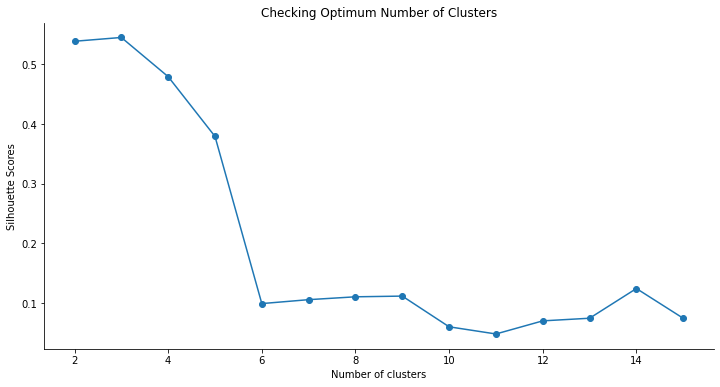

In [59]:
print(scores)
print(kval)
plot(kval, scores)

The value with highest silhouette_score peaks at 3 and then begins to drops off. We would choose 3 clusters, but for some more options we will choose 5 clusters, to find a suitable location giving us more options is preferred but might not make any difference.

In [60]:
#set number of clusters
kclusters = 5

Queens_grouped_clustering = Queens_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Queens_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

#Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Queens_merged = Queens_data

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
Queens_merged = Queens_merged.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')

Queens_merged.head() # check the last columns!


,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Queens,Astoria,40.768509,-73.915654,3,Bar,Middle Eastern Restaurant,Hookah Bar,Greek Restaurant,Seafood Restaurant,Café,Deli / Bodega,Indian Restaurant,Bakery,Mediterranean Restaurant
1,Queens,Woodside,40.746349,-73.901842,3,Grocery Store,Thai Restaurant,Bakery,Filipino Restaurant,Pizza Place,Latin American Restaurant,American Restaurant,Pub,Donut Shop,Chinese Restaurant
2,Queens,Jackson Heights,40.751981,-73.882821,3,Latin American Restaurant,Peruvian Restaurant,South American Restaurant,Bakery,Mobile Phone Shop,Thai Restaurant,Mexican Restaurant,Grocery Store,Pharmacy,Pizza Place
3,Queens,Elmhurst,40.744049,-73.881656,3,Thai Restaurant,Mexican Restaurant,Bubble Tea Shop,Vietnamese Restaurant,Chinese Restaurant,Gym / Fitness Center,Seafood Restaurant,Sushi Restaurant,Fast Food Restaurant,Malay Restaurant
4,Queens,Howard Beach,40.654225,-73.838138,3,Italian Restaurant,Pharmacy,Chinese Restaurant,Sandwich Place,Fast Food Restaurant,Japanese Restaurant,Clothing Store,Gym,Mexican Restaurant,Seafood Restaurant


Finally, let's visualize the resulting clusters

In [61]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Queens_merged['Latitude'], Queens_merged['Longitude'], Queens_merged['Neighbourhood'], Queens_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## 2.4.3 Examining clusters

For now I will create the clusters and add a final note on the slection at the end of the analysis. For an example of what commentary I would give each cluster here is some commentary on the first cluster:

Cluster 1
Appears to be rather outdoors with recreational areas such as the beach and trails. There some offices and grocery stores but seems this are is a day spot rather than niehgbourhood for living and working.

In [62]:
Queens_merged.loc[Queens_merged['Cluster Labels'] == 0, Queens_merged.columns[[1] + list(range(5, Queens_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
79,Bayswater,Playground,Accessories Store,New American Restaurant,Other Great Outdoors,Organic Grocery,Optical Shop,Office,Noodle House,Nightclub,Neighborhood


In [63]:
#Cluster 2
Queens_merged.loc[Queens_merged['Cluster Labels'] == 1, Queens_merged.columns[[1] + list(range(5, Queens_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
19,South Ozone Park,Park,Deli / Bodega,Bar,Donut Shop,Fast Food Restaurant,Sandwich Place,Hotel,Food Truck,Nightclub,Noodle House
42,Broad Channel,Deli / Bodega,Dive Bar,Sporting Goods Shop,Other Nightlife,Pizza Place,Park,Plaza,Poke Place,Post Office,Multiplex
63,Somerville,Park,Business Service,Noodle House,Outdoors & Recreation,Other Nightlife,Other Great Outdoors,Organic Grocery,Optical Shop,Office,Nightclub


In [64]:
Queens_merged.loc[Queens_merged['Cluster Labels'] == 2, Queens_merged.columns[[1] + list(range(5, Queens_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
64,Brookville,Deli / Bodega,Market,Accessories Store,Noodle House,Other Nightlife,Other Great Outdoors,Organic Grocery,Optical Shop,Office,Nightclub


In [65]:
Queens_merged.loc[Queens_merged['Cluster Labels'] == 3, Queens_merged.columns[[1] + list(range(5, Queens_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Astoria,Bar,Middle Eastern Restaurant,Hookah Bar,Greek Restaurant,Seafood Restaurant,Café,Deli / Bodega,Indian Restaurant,Bakery,Mediterranean Restaurant
1,Woodside,Grocery Store,Thai Restaurant,Bakery,Filipino Restaurant,Pizza Place,Latin American Restaurant,American Restaurant,Pub,Donut Shop,Chinese Restaurant
2,Jackson Heights,Latin American Restaurant,Peruvian Restaurant,South American Restaurant,Bakery,Mobile Phone Shop,Thai Restaurant,Mexican Restaurant,Grocery Store,Pharmacy,Pizza Place
3,Elmhurst,Thai Restaurant,Mexican Restaurant,Bubble Tea Shop,Vietnamese Restaurant,Chinese Restaurant,Gym / Fitness Center,Seafood Restaurant,Sushi Restaurant,Fast Food Restaurant,Malay Restaurant
4,Howard Beach,Italian Restaurant,Pharmacy,Chinese Restaurant,Sandwich Place,Fast Food Restaurant,Japanese Restaurant,Clothing Store,Gym,Mexican Restaurant,Seafood Restaurant
5,Corona,Supermarket,Mexican Restaurant,Italian Restaurant,Pizza Place,Food Truck,South American Restaurant,Chinese Restaurant,Park,Sandwich Place,Bakery
6,Forest Hills,Gym / Fitness Center,Gym,Park,Thai Restaurant,Convenience Store,Pharmacy,Pizza Place,Yoga Studio,Optical Shop,Martial Arts School
7,Kew Gardens,Chinese Restaurant,Pet Store,Liquor Store,Cosmetics Shop,Bar,Bank,Pizza Place,Indian Restaurant,Bus Stop,Donut Shop
8,Richmond Hill,Bank,Lounge,Pizza Place,Latin American Restaurant,Caribbean Restaurant,Metro Station,Supermarket,Moving Target,Spanish Restaurant,Intersection
9,Flushing,Hotpot Restaurant,Korean Restaurant,Bubble Tea Shop,Karaoke Bar,Chinese Restaurant,Bakery,Gym / Fitness Center,Construction & Landscaping,Bus Stop,Gym


In [66]:
Queens_merged.loc[Queens_merged['Cluster Labels'] == 4, Queens_merged.columns[[1] + list(range(5, Queens_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
43,Breezy Point,Beach,Monument / Landmark,Trail,Paper / Office Supplies Store,Other Nightlife,Other Great Outdoors,Organic Grocery,Optical Shop,Office,Noodle House
50,Neponsit,Beach,Accessories Store,Noodle House,Other Nightlife,Other Great Outdoors,Organic Grocery,Optical Shop,Office,Nightclub,Paper / Office Supplies Store


# 2.5 The Bronx
Repeat the process for the Bronx neighbourhood data, ill just be a minute...

In [67]:
# one hot encoding
Bronx_onehot = pd.get_dummies(Bronx_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to Queens_venues
Bronx_onehot['Neighbourhood'] = Bronx_venues['Neighbourhood'] 

# move neighborhood column to the first column
fixed_columns = [Bronx_onehot.columns[-1]] + list(Bronx_onehot.columns[:-1])
Bronx_onehot = Bronx_onehot[fixed_columns]

print(Bronx_onehot.shape)
Bronx_onehot.head()

(1205, 176)


,Neighbourhood,Accessories Store,African Restaurant,American Restaurant,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beer Bar,Board Shop,Boat or Ferry,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Buffet,Building,Burger Joint,Bus Line,Bus Station,Bus Stop,Café,Candy Store,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Clothing Store,Coffee Shop,Comfort Food Restaurant,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cuban Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Donut Shop,Eastern European Restaurant,Electronics Store,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gas Station,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hotel,IT Services,Ice Cream Shop,Indian Restaurant,Indie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Liquor Store,Lounge,Market,Martial Arts School,Mattress Store,Medical Supply Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Moving Target,Music Venue,Nightclub,Office,Outdoors & Recreation,Outlet Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pizza Place,Platform,Playground,Plaza,Pool,Post Office,Print Shop,Pub,Puerto Rican Restaurant,Recording Studio,Recreation Center,Rental Car Location,Restaurant,River,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Smoke Shop,Social Club,Soup Place,South American Restaurant,Spa,Spanish Restaurant,Sports Bar,Sports Club,Storage Facility,Supermarket,Supplement Shop,Sushi Restaurant,Tapas Restaurant,Tattoo Parlor,Tennis Court,Tennis Stadium,Thai Restaurant,Thrift / Vintage Store,Trail,Train Station,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Waste Facility,Wings Joint,Women's Store
0,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [68]:
Bronx_grouped = Bronx_onehot.groupby('Neighbourhood').mean().reset_index()
print(Bronx_grouped.shape)
Bronx_grouped

(52, 176)


,Neighbourhood,Accessories Store,African Restaurant,American Restaurant,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beer Bar,Board Shop,Boat or Ferry,Bookstore,Bowling Alley,Breakfast Spot,Brewery,Buffet,Building,Burger Joint,Bus Line,Bus Station,Bus Stop,Café,Candy Store,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Clothing Store,Coffee Shop,Comfort Food Restaurant,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cuban Restaurant,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Donut Shop,Eastern European Restaurant,Electronics Store,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gas Station,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hotel,IT Services,Ice Cream Shop,Indian Restaurant,Indie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Liquor Store,Lounge,Market,Martial Arts School,Mattress Store,Medical Supply Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Moving Target,Music Venue,Nightclub,Office,Outdoors & Recreation,Outlet Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pizza Place,Platform,Playground,Plaza,Pool,Post Office,Print Shop,Pub,Puerto Rican Restaurant,Recording Studio,Recreation Center,Rental Car Location,Restaurant,River,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Seafood Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Smoke Shop,Social Club,Soup Place,South American Restaurant,Spa,Spanish Restaurant,Sports Bar,Sports Club,Storage Facility,Supermarket,Supplement Shop,Sushi Restaurant,Tapas Restaurant,Tattoo Parlor,Tennis Court,Tennis Stadium,Thai Restaurant,Thrift / Vintage Store,Trail,Train Station,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Waste Facility,Wings Joint,Women's Store
0,Allerton,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.0,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.066667,0.000000,0.000000,0.066667,0.033333,0.033333,0.000000,0.033333,0.0,0.000000,0.000000,0.033333,0.000000,0.033333,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.00,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.133333,0.000000,0.033333,0.000000,0.000000,0.000000,0.0,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

In [69]:
num_top_venues = 5

for hood in Bronx_grouped['Neighbourhood']:
    print("----"+hood+"----")
    temp = Bronx_grouped[Bronx_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:] 
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
            venue  freq
0     Pizza Place  0.13
1     Supermarket  0.10
2          Bakery  0.10
3   Deli / Bodega  0.07
4  Cosmetics Shop  0.07


----Baychester----
                 venue  freq
0           Donut Shop  0.09
1                 Bank  0.09
2    Convenience Store  0.04
3        Shopping Mall  0.04
4  Fried Chicken Joint  0.04


----Bedford Park----
                venue  freq
0               Diner  0.11
1  Mexican Restaurant  0.11
2  Chinese Restaurant  0.11
3         Pizza Place  0.08
4      Sandwich Place  0.06


----Belmont----
                venue  freq
0  Italian Restaurant  0.19
1         Pizza Place  0.09
2       Deli / Bodega  0.07
3              Bakery  0.05
4       Grocery Store  0.03


----Bronxdale----
                         venue  freq
0           Italian Restaurant  0.09
1                         Bank  0.09
2                  Pizza Place  0.09
3  Eastern European Restaurant  0.09
4           Chinese Restaurant  0.09


----Castle Hill----
   

In [70]:
#num_top_venues = 10

#indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighbourhood'] #may need to be Bronx_grouped['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Neighbourhood'] = Bronx_grouped['Neighbourhood']

for ind in np.arange(Bronx_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Bronx_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sorted.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Allerton,Pizza Place,Supermarket,Bakery,Deli / Bodega,Cosmetics Shop
1,Baychester,Donut Shop,Bank,Convenience Store,Shopping Mall,Fried Chicken Joint
2,Bedford Park,Diner,Mexican Restaurant,Chinese Restaurant,Pizza Place,Sandwich Place
3,Belmont,Italian Restaurant,Pizza Place,Deli / Bodega,Bakery,Grocery Store
4,Bronxdale,Italian Restaurant,Bank,Pizza Place,Eastern European Restaurant,Chinese Restaurant


In [71]:
#set number of clusters
kclusters = 5

Bronx_grouped_clustering = Bronx_grouped.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Bronx_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

#Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Bronx_merged = Bronx_data

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
Bronx_merged = Bronx_merged.join(neighbourhoods_venues_sorted.set_index('Neighbourhood'), on='Neighbourhood')

Bronx_merged.head() # check the last columns!


,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,1,Pharmacy,Deli / Bodega,Laundromat,Donut Shop,Sandwich Place
1,Bronx,Co-op City,40.874294,-73.829939,1,Fast Food Restaurant,Bus Station,Baseball Field,Discount Store,Fried Chicken Joint
2,Bronx,Eastchester,40.887556,-73.827806,1,Caribbean Restaurant,Bus Station,Diner,Deli / Bodega,Cosmetics Shop
3,Bronx,Fieldston,40.895437,-73.905643,0,Plaza,River,Bus Station,Medical Supply Store,Accessories Store
4,Bronx,Riverdale,40.890834,-73.912585,0,Park,Bus Station,Plaza,Food Truck,Gym


In [72]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Bronx_merged['Latitude'], Bronx_merged['Longitude'], Bronx_merged['Neighbourhood'], Bronx_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [73]:
Bronx_merged.loc[Bronx_merged['Cluster Labels'] == 0, Bronx_merged.columns[[1] + list(range(5, Bronx_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
3,Fieldston,Plaza,River,Bus Station,Medical Supply Store,Accessories Store
4,Riverdale,Park,Bus Station,Plaza,Food Truck,Gym


In [74]:
Bronx_merged.loc[Bronx_merged['Cluster Labels'] == 1, Bronx_merged.columns[[1] + list(range(5, Bronx_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Wakefield,Pharmacy,Deli / Bodega,Laundromat,Donut Shop,Sandwich Place
1,Co-op City,Fast Food Restaurant,Bus Station,Baseball Field,Discount Store,Fried Chicken Joint
2,Eastchester,Caribbean Restaurant,Bus Station,Diner,Deli / Bodega,Cosmetics Shop
5,Kingsbridge,Pizza Place,Bar,Sandwich Place,Mexican Restaurant,Latin American Restaurant
6,Woodlawn,Deli / Bodega,Pizza Place,Pub,Playground,Food & Drink Shop
7,Norwood,Pizza Place,Park,Pharmacy,Bank,Convenience Store
8,Williamsbridge,Caribbean Restaurant,Spa,Soup Place,Nightclub,Metro Station
9,Baychester,Donut Shop,Bank,Convenience Store,Shopping Mall,Fried Chicken Joint
10,Pelham Parkway,Italian Restaurant,Chinese Restaurant,Pizza Place,Bank,Bakery
11,City Island,Seafood Restaurant,Park,Thrift / Vintage Store,Harbor / Marina,Bar


In [75]:
Bronx_merged.loc[Bronx_merged['Cluster Labels'] == 2, Bronx_merged.columns[[1] + list(range(5, Bronx_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
28,Country Club,Playground,Sandwich Place,Flea Market,Athletics & Sports,Accessories Store


In [76]:
Bronx_merged.loc[Bronx_merged['Cluster Labels'] == 3, Bronx_merged.columns[[1] + list(range(5, Bronx_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
44,Edenwald,Bus Station,Supermarket,Grocery Store,Athletics & Sports,Chinese Restaurant


In [77]:
Bronx_merged.loc[Bronx_merged['Cluster Labels'] == 4, Bronx_merged.columns[[1] + list(range(5, Bronx_merged.shape[1]))]]

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
26,Clason Point,Park,Recording Studio,Moving Target,Boat or Ferry,Bus Stop


# 3.0 Results and Discussion



By analysing the data we have available to use we should take note of some interesting insights.

## 3.1 Cencus Data 
Queens is by far a higher populated, better educated and higher income area. That doesnt come without any drawbacks where there is evidence if a higher rent burden on residents living in this borough. 

## 3.2 FourSquare API Venue data
From reviewing the clusters in Queens and The Bronx, the k-means clustering alogritim is telling us that both boroughs are fairly well distributed in terms of restaurants, cafes and supermarkets with cluster 3 in Queens and cluster 1 in The Bronx containing most neighbourhoods. Each of these clusters would be the ideal area to open a kitchen for the respective boroughs as there is already evidence of a food culture here from FourSquare API venue data. The other clusters are less suitable as we will discuss below.

What it does help us with is elminating a number of clusters where the neighbourhoods are predominantely recreation or public service areas. Queens Clusters 0,1, 2 and 4 main venue is recretional, while the Bronx has cluster 0, 2, 3 and 4 are either public service or recreational areas. It might not appear like much in the map, but it is helping with eliminating some neighbourhoods!

## 3.3 Map 
Observationally, Queens map has 1 larger cluster, where the remaining clusters are situated in the peripherials of the Borough. We woudl like to be situated in a neighbourhood which is more accessible from all directions hence the more remote clusters in Queens Clusters 0,1, 2 and 4 are less suitable to our business needs.

# 4.0 Conclusion

We have successfully finished our analyses. Based on the insights taken from multiple data sources, we can conlude that we will be looking for a venue in Queens Cluster 3. This is becuase 
1. From census data we anticipate our target market of professionals working from home will be located in this area. Primarly in Queens as our first preference in Borough/area.
2. There is evidence of a food culture in this cluser from FourSquare API venue data.
3. Map and venue data show that remain clusters in Queens 0, 1, 2 and 4 are too remote for our business needs.

# Thank you for reviewing this analysis

Your time and effort is greatly appreciated. I wish you all the best!